# Yolo

### Source:

##### https://github.com/ultralytics/yolov5/wiki/Docker-Quickstart
##### https://github.com/WongKinYiu/yolov7
##### https://colab.research.google.com/github/ultralytics/yolov5/blob/master/tutorial.ipynb#scrollTo=1NcFxRcFdJ_O
##### https://arxiv.org/abs/2305.09972
##### https://hub.docker.com/r/ultralytics/yolov5
##### https://blog.paperspace.com/train-yolov7-custom-data/
##### https://docs.ultralytics.com/yolov5/tutorials/pytorch_hub_model_loading/


### Question: 
#### number of workers dataloader, shared memory ???
#### tensorboard 
#### cuda treiber GPU PyTorch Image
#### how train new class
#### change architecure 
#### nummer lesen Ampullen
#### Übung autoencoder lösung

In [1]:
pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.1/40.1 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 699.8/699.8 kB 252.6 kB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 79.2 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 77.1 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 40.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.8/294.8 kB 25.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.7/310.7 kB 59.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 90.8 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 71.2 MB/s eta 

In [2]:
pip install utils

  Preparing metadata (setup.py) ... done
  Created wheel for utils: filename=utils-1.0.2-py2.py3-none-any.whl size=13905 sha256=25cdaf7938e53b161654d29fef0a6e419945ba48a737f1bf9d4f83fc6d7af0db
  Stored in directory: /root/.cache/pip/wheels/b8/39/f5/9d0ca31dba85773ececf0a7f5469f18810e1c8a8ed9da28ca7
Successfully built utils
Note: you may need to restart the kernel to use updated packages.


In [1]:
from ultralytics import YOLO
import torch
import utils
from IPython.display import display, Image
import os
import random
import cv2

print(torch.cuda.is_available())
print(torch.__version__)

True
2.1.2


### How the data is labeled in yolo format

Folder structure:

    

![Beschreibung des Bildes](label_yolo.png)


### Check pretrained yolo predictions

In [2]:
#model =  YOLO('yolov8n.yaml')
# use a pretrained Yolo
model = YOLO('yolov8n.yaml')  # build a new model from YAML
model = YOLO('yolov8n.pt')
model = YOLO('yolov8n.yaml').load('yolov8n.pt')  # build from YAML and transfer weights


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

In [3]:
# Pfade anpassen
train_images_path = '/my_app/Yolo/images/train'

# Alle Bildpfade im Trainingsdatensatz erhalten
all_image_paths = [os.path.join(train_images_path, file) for file in os.listdir(train_images_path) if file.endswith(('.jpg', '.jpeg', '.png'))]


# Zufällige Auswahl von 3 Bildpfaden
random_images = random.sample(all_image_paths, 3)

# Ausgabe der gesamten Bildpfade
for image_path in random_images:
    model.predict(image_path, save=True, imgsz=1024, conf=0.5)



image 1/1 /my_app/Yolo/images/train/1cc77c32-a2cb4cb9.jpg: 576x1024 14 2s, 3 9s, 94.0ms
Speed: 6.2ms preprocess, 94.0ms inference, 1.8ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to runs/detect/predict

image 1/1 /my_app/Yolo/images/train/6d70fb2b-710f2aca.jpg: 576x1024 2 2s, 7.9ms
Speed: 3.0ms preprocess, 7.9ms inference, 1.1ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to runs/detect/predict

image 1/1 /my_app/Yolo/images/train/773c53f2-d08f32d1.jpg: 576x1024 1 2, 5.7ms
Speed: 3.1ms preprocess, 5.7ms inference, 1.1ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to runs/detect/predict


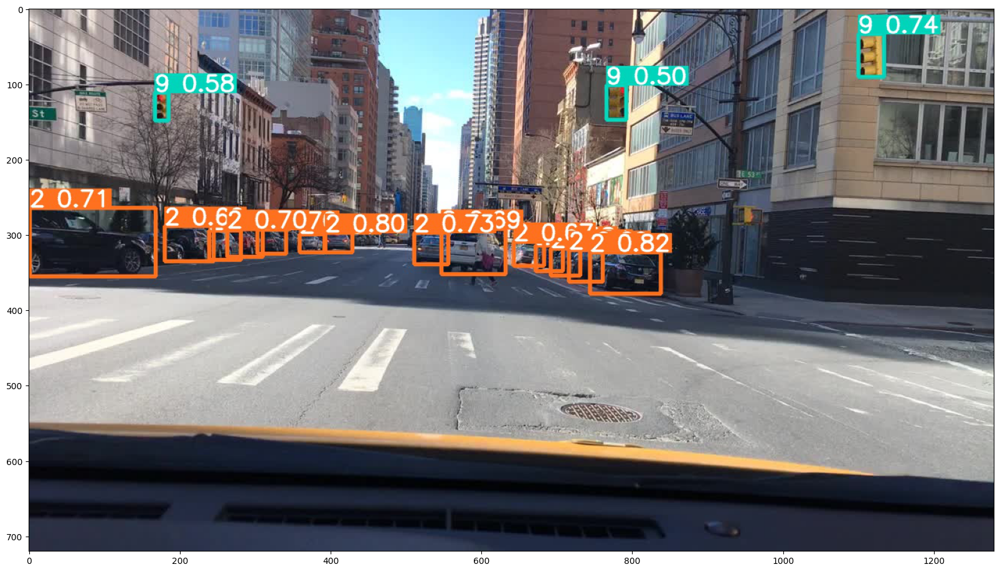

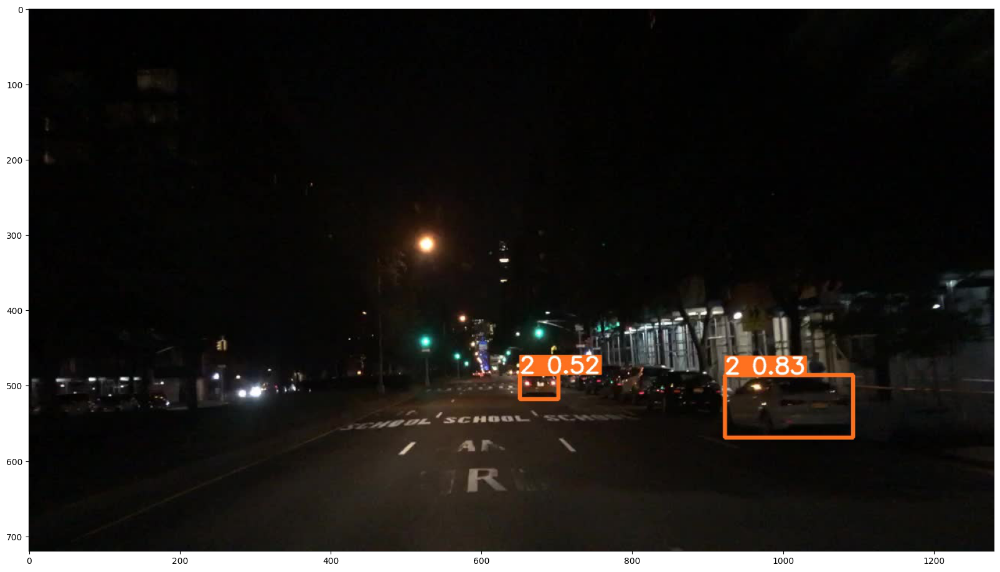

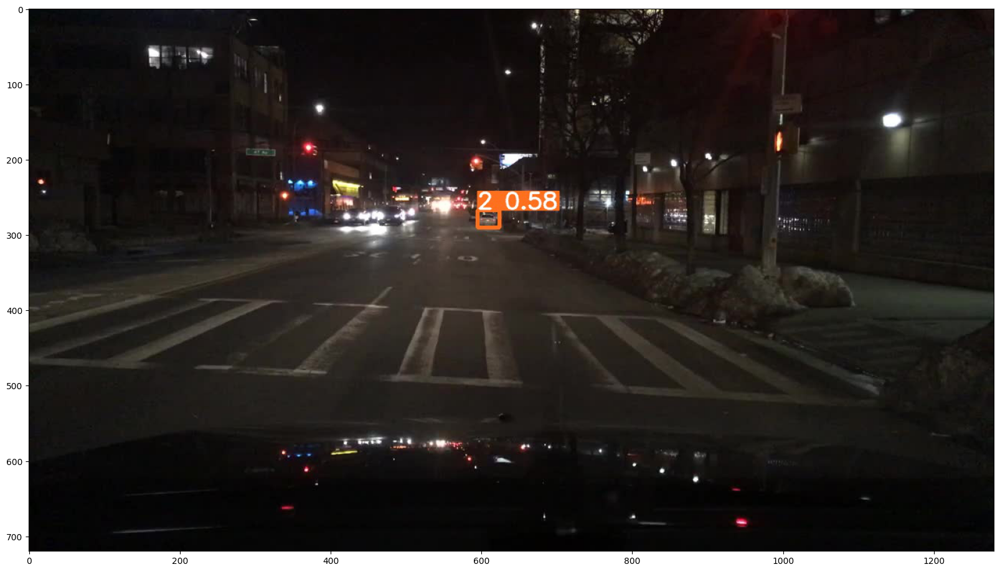

In [7]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Pfade anpassen
image_folder_path = './runs/detect/predict/'

# Alle Bildpfade im Ordner erhalten
all_image_paths = [os.path.join(image_folder_path, file) for file in os.listdir(image_folder_path) if file.endswith(('.jpg', '.jpeg', '.png'))]

# Bilder in Originalgröße plotten
for image_path in all_image_paths:
    img = plt.imread(image_path)    
    plt.figure(figsize=(20, 20))
    plt.imshow(img)
    plt.show()

### I want to see some specific classes which were hard to train: train, other vehicels, other persons, trailer

In [15]:
# class 9
image_path_train = '/my_app/Yolo/images/train/b11a76c4-c8f7a1bc.jpg'
# class 12
image_path_trailer = '/my_app/Yolo/images/train/fe10df8f-e5963216.jpg'
# class 10
image_path_other_vehicel = '/my_app/Yolo/images/train/fe0b200a-35da98ba.jpg'
# class 11
image_path_other_person = '/my_app/Yolo/images/train/fdf465ad-3b5d188e.jpg'

model.predict(image_path_train, save=True, imgsz=1024, conf=0.5, verbose=False)
model.predict(image_path_trailer, save=True, imgsz=1024, conf=0.5, verbose=False)
model.predict(image_path_other_vehicel, save=True, imgsz=1024, conf=0.5, verbose=False)
model.predict(image_path_other_person, save=True, imgsz=1024, conf=0.5, verbose=False)


Results saved to runs/detect/predict
Results saved to runs/detect/predict
Results saved to runs/detect/predict
Results saved to runs/detect/predict


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: '0', 1: '1', 2: '2', 3: '3', 4: '4', 5: '5', 6: '6', 7: '7', 8: '8', 9: '9', 10: '10', 11: '11', 12: '12', 13: '13', 14: '14', 15: '15', 16: '16', 17: '17', 18: '18', 19: '19', 20: '20', 21: '21', 22: '22', 23: '23', 24: '24', 25: '25', 26: '26', 27: '27', 28: '28', 29: '29', 30: '30', 31: '31', 32: '32', 33: '33', 34: '34', 35: '35', 36: '36', 37: '37', 38: '38', 39: '39', 40: '40', 41: '41', 42: '42', 43: '43', 44: '44', 45: '45', 46: '46', 47: '47', 48: '48', 49: '49', 50: '50', 51: '51', 52: '52', 53: '53', 54: '54', 55: '55', 56: '56', 57: '57', 58: '58', 59: '59', 60: '60', 61: '61', 62: '62', 63: '63', 64: '64', 65: '65', 66: '66', 67: '67', 68: '68', 69: '69', 70: '70', 71: '71', 72: '72', 73: '73', 74: '74', 75: '75', 76: '76', 77: '77', 78: '78', 79: '79'}
 obb: None
 orig_img: array([[[127, 147, 165],
         [126, 146, 164]

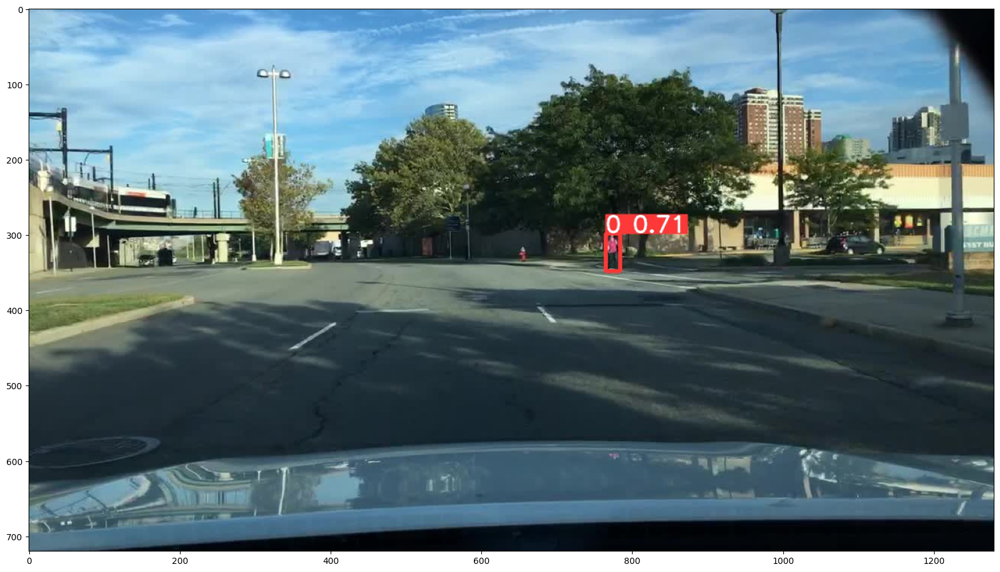

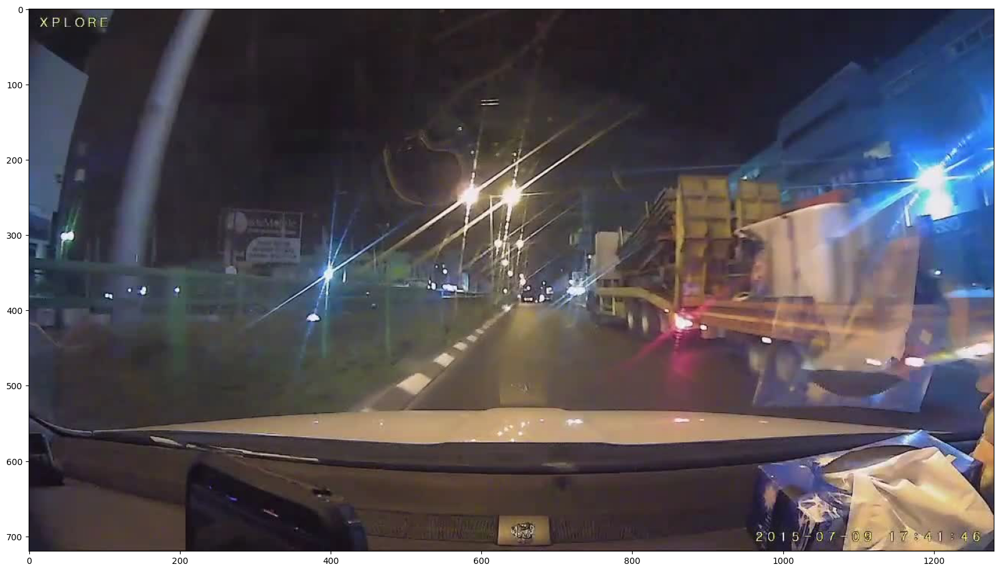

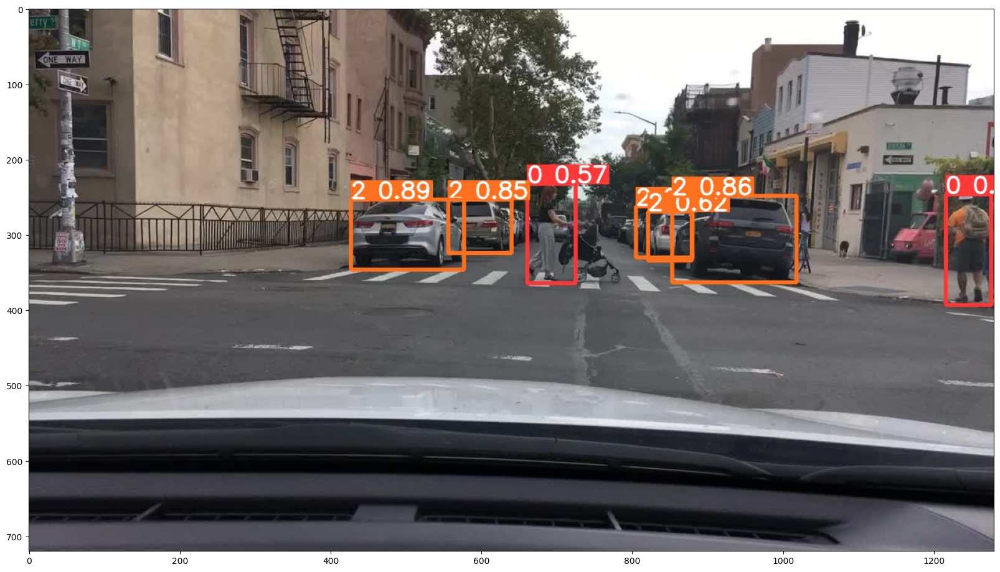

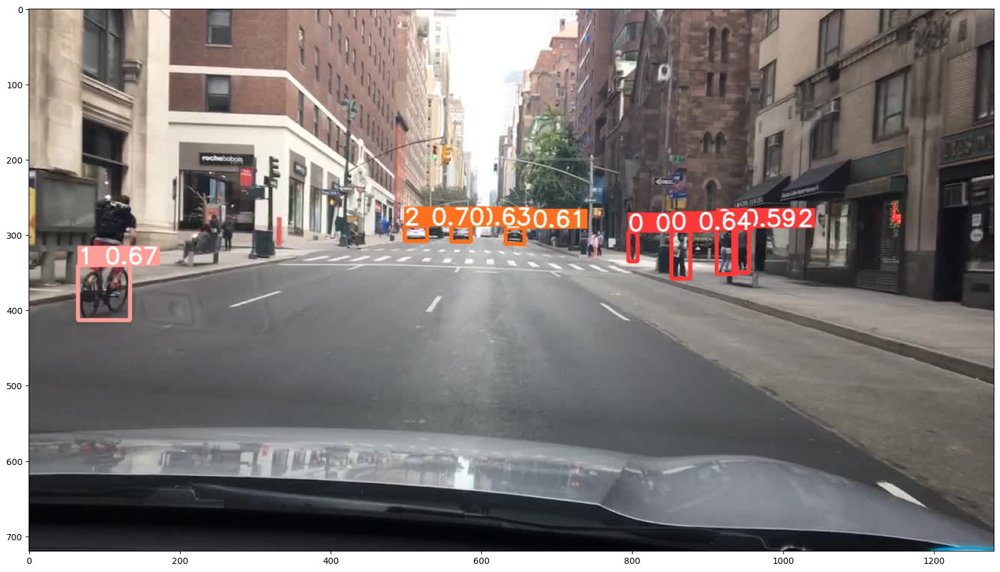

In [18]:
detection_train = 'runs/detect/predict/b11a76c4-c8f7a1bc.jpg'         
detection_trailer = 'runs/detect/predict/fe10df8f-e5963216.jpg'  
detection_other_vehicels = 'runs/detect/predict/fe0b200a-35da98ba.jpg'  
detection_other_persons = 'runs/detect/predict/fdf465ad-3b5d188e.jpg'  

# Liste der detektierten Bildpfade
detected_image_paths = [detection_train, detection_trailer, detection_other_vehicels, detection_other_persons]

# Bilder in Originalgröße plotten
for image_path in detected_image_paths:
    img = plt.imread(image_path)    
    plt.figure(figsize=(20, 20))
    plt.imshow(img)
    plt.show()

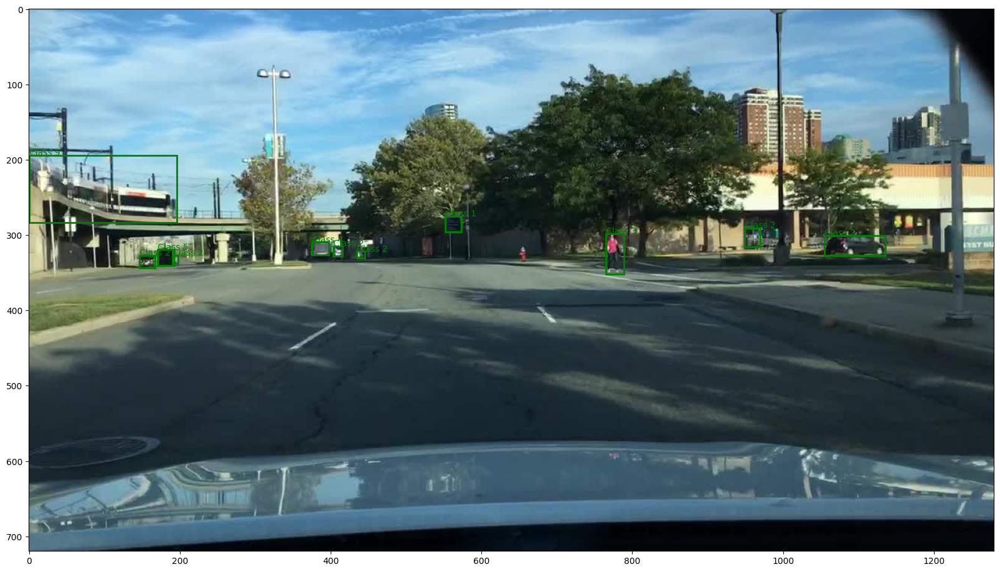

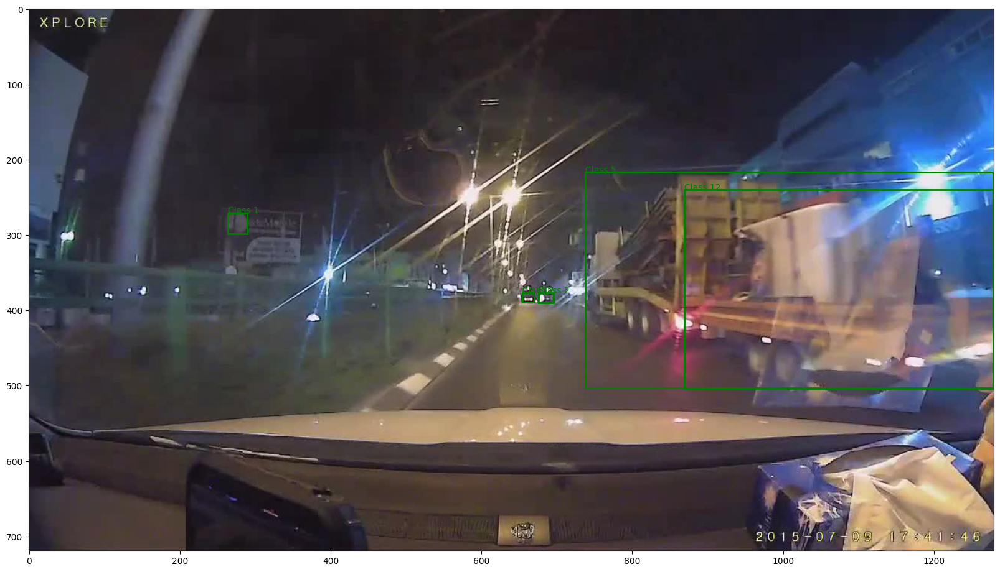

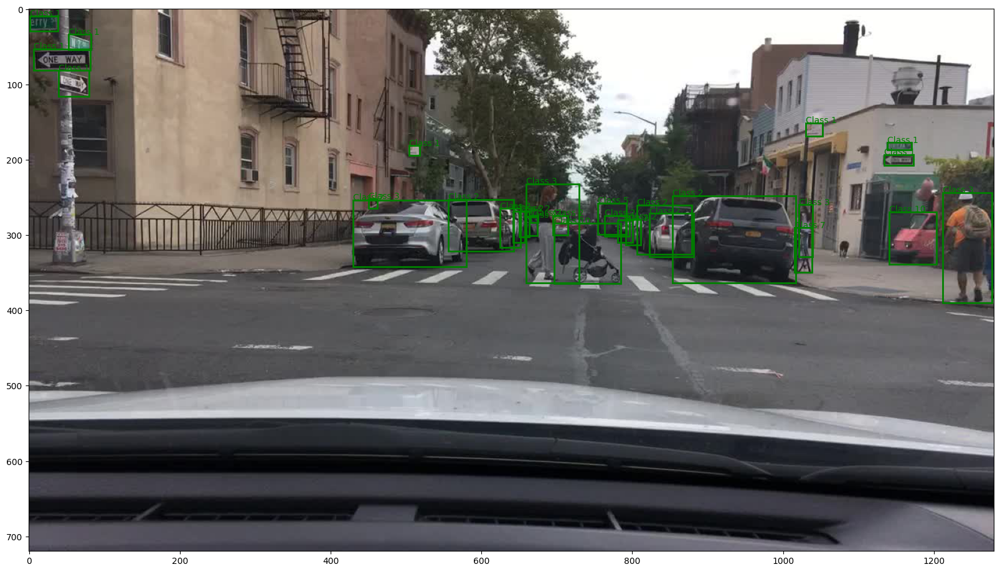

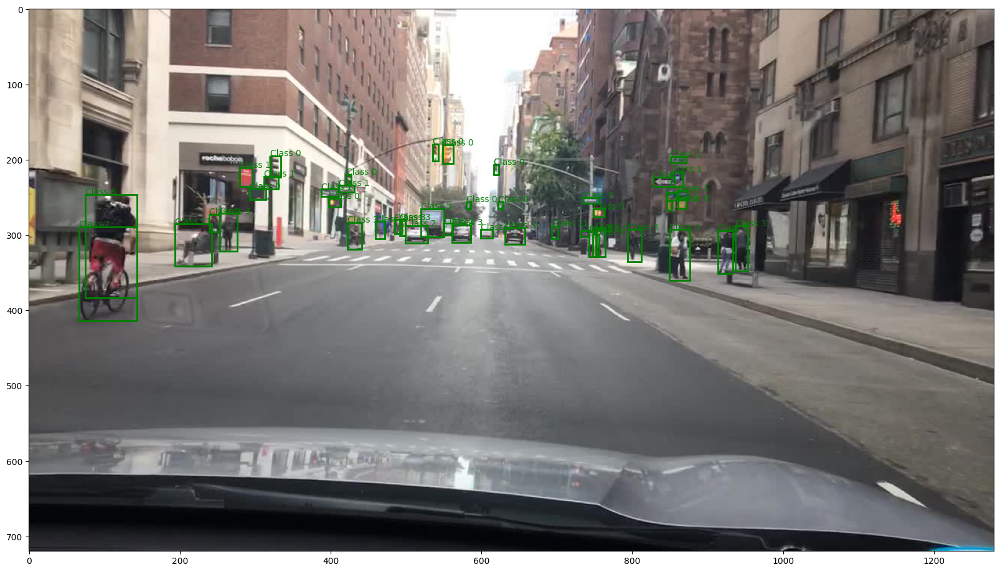

In [26]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_ground_truth(image_path, ground_truth_annotation_path):
    # Lade das Bild
    img = Image.open(image_path)

    # Neue Bildgröße festlegen (in Zoll)
    new_figsize = (20, 20)

    # Erstelle eine Figur und Achsen mit der neuen Bildgröße
    fig, ax = plt.subplots(1, figsize=new_figsize)

    # Zeige das Bild an
    ax.imshow(img)

    # Lade Ground Truth-Annotationen
    with open(ground_truth_annotation_path, 'r') as file:
        lines = file.readlines()

    # Durchlaufe die Annotationen und füge Rechtecke hinzu
    for line in lines:
        data = line.split()

        # Annahme: Das Format ist "class x_center y_center width height"
        class_id, x_center, y_center, width, height = map(float, data)

        # Konvertiere die Annotationen in Koordinaten
        x, y = x_center * img.width, y_center * img.height
        w, h = width * img.width, height * img.height

        # Füge ein Rechteck für Ground Truth hinzu
        rect = patches.Rectangle((x - w / 2, y - h / 2), w, h, linewidth=2, edgecolor='g', facecolor='none')
        ax.add_patch(rect)

        # Füge die Klassennummer als Text hinzu
        ax.text(x - w / 2, y - h / 2, f'Class {int(class_id)}', fontsize=10, color='g')

    # Zeige das Bild mit Ground Truth an
    plt.show()

# Pfade zu den Bildern
image_path1 = '/my_app/Yolo/images/train/b11a76c4-c8f7a1bc.jpg'
ground_truth_annotation_path1 = '/my_app/Yolo/labels/train/b11a76c4-c8f7a1bc.txt'

image_path2 = '/my_app/Yolo/images/train/fe10df8f-e5963216.jpg'
ground_truth_annotation_path2 = '/my_app/Yolo/labels/train/fe10df8f-e5963216.txt'

image_path3 = '/my_app/Yolo/images/train/fe0b200a-35da98ba.jpg'
ground_truth_annotation_path3 = '/my_app/Yolo/labels/train/fe0b200a-35da98ba.txt'

image_path4 = '/my_app/Yolo/images/train/fdf465ad-3b5d188e.jpg'
ground_truth_annotation_path4 = '/my_app/Yolo/labels/train/fdf465ad-3b5d188e.txt'

# Visualisiere Ground Truth für jedes Bild
visualize_ground_truth(image_path1, ground_truth_annotation_path1)
visualize_ground_truth(image_path2, ground_truth_annotation_path2)
visualize_ground_truth(image_path3, ground_truth_annotation_path3)
visualize_ground_truth(image_path4, ground_truth_annotation_path4)


In [27]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_ground_truth(image_path, ground_truth_annotation_path):
    # Lade das Bild
    img = Image.open(image_path)

    # Neue Bildgröße festlegen (in Zoll)
    new_figsize = (20, 20)

    # Erstelle eine Figur und Achsen mit der neuen Bildgröße
    fig, ax = plt.subplots(1, figsize=new_figsize)

    # Zeige das Bild an
    ax.imshow(img)

    # Lade Ground Truth-Annotationen
    with open(ground_truth_annotation_path, 'r') as file:
        lines = file.readlines()

    # Durchlaufe die Annotationen und füge Rechtecke hinzu
    for line in lines:
        data = line.split()

        # Annahme: Das Format ist "class x_center y_center width height"
        class_id, x_center, y_center, width, height = map(float, data)

        # Konvertiere die Annotationen in Koordinaten
        x, y = x_center * img.width, y_center * img.height
        w, h = width * img.width, height * img.height

        # Wähle die Farbe basierend auf der Klasse
        color = 'g'  # Standardfarbe für andere Klassen
        if int(class_id) == 9:
            color = 'b'  # Blau für Klasse 9
        elif int(class_id) == 10:
            color = 'r'  # Rot für Klasse 10
        elif int(class_id) == 11:
            color = 'y'  # Gelb für Klasse 11
        elif int(class_id) == 12:
            color = 'purple'  # Lila für Klasse 12

        # Füge ein Rechteck für Ground Truth hinzu
        rect = patches.Rectangle((x - w / 2, y - h / 2), w, h, linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)

        # Füge die Klassennummer als Text hinzu
        ax.text(x - w / 2, y - h / 2, f'Class {int(class_id)}', fontsize=10, color=color)

    # Zeige das Bild mit Ground Truth an


### Finetune pretrained model

In [4]:
results = model.train(data='/my_app/Yolo/dataset.yaml', epochs=40)

New https://pypi.org/project/ultralytics/8.1.0 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.239 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (NVIDIA A100-SXM4-40GB, 40338MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=/my_app/Yolo/dataset.yaml, epochs=40, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False,

train: Scanning /my_app/Yolo/labels/train.cache... 69853 images, 0 backgrounds, 0 corrupt: 100%|██████████| 69853/69853 [00:00<?, ?it/s]
val: Scanning /my_app/Yolo/labels/val.cache... 10000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10000/10000 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
40 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/40      3.25G      1.822      1.753      1.267        488        640: 100%|██████████| 4366/4366 [06:51<00:00, 10.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 71/313 [01:26<05:16,  1.31s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  39%|███▉      | 122/313 [02:33<04:35,  1.44s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  40%|████      | 126/313 [02:39<04:27,  1.43s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  92%|█████████▏| 287/313 [06:13<00:32,  1.24s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [06:47<00:00,  1.30s/it]


                   all      10000     186033      0.445     0.0595     0.0578     0.0323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/40       4.4G      1.457      1.106      1.048        408        640: 100%|██████████| 4366/4366 [06:52<00:00, 10.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  72%|███████▏  | 225/313 [01:59<00:56,  1.57it/s]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [02:47<00:00,  1.87it/s]


                   all      10000     186033      0.143     0.0848     0.0609      0.035

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/40      3.95G      1.411      1.002      1.026        329        640: 100%|██████████| 4366/4366 [06:36<00:00, 11.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [01:41<00:00,  3.09it/s]


                   all      10000     186033      0.137     0.0956     0.0615     0.0358

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/40      4.34G      1.383     0.9561      1.016        538        640: 100%|██████████| 4366/4366 [06:41<00:00, 10.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [01:43<00:00,  3.02it/s]


                   all      10000     186033      0.303      0.071      0.062     0.0366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/40      4.25G      1.357     0.9176      1.006        546        640: 100%|██████████| 4366/4366 [06:29<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [01:15<00:00,  4.13it/s]


                   all      10000     186033      0.219     0.0673     0.0622     0.0369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/40      4.44G      1.345     0.8997     0.9995        255        640: 100%|██████████| 4366/4366 [06:33<00:00, 11.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [01:15<00:00,  4.17it/s]


                   all      10000     186033      0.222     0.0712     0.0631     0.0375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/40      4.63G      1.333     0.8836     0.9946        428        640: 100%|██████████| 4366/4366 [06:28<00:00, 11.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [01:11<00:00,  4.37it/s]


                   all      10000     186033      0.224     0.0685     0.0636      0.038

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/40      3.88G      1.325     0.8717     0.9906        468        640: 100%|██████████| 4366/4366 [07:01<00:00, 10.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [01:10<00:00,  4.42it/s]


                   all      10000     186033      0.225      0.071     0.0637     0.0382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/40      3.66G      1.316     0.8627     0.9882        443        640: 100%|██████████| 4366/4366 [06:22<00:00, 11.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [01:04<00:00,  4.86it/s]


                   all      10000     186033      0.219     0.0743     0.0641     0.0385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/40       4.5G       1.31     0.8544     0.9856        442        640: 100%|██████████| 4366/4366 [06:26<00:00, 11.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [01:03<00:00,  4.91it/s]


                   all      10000     186033      0.221     0.0687     0.0639     0.0384

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/40      5.81G      1.308     0.8502     0.9843        471        640: 100%|██████████| 4366/4366 [06:20<00:00, 11.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:59<00:00,  5.25it/s]


                   all      10000     186033      0.221     0.0681      0.064     0.0386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/40      3.22G      1.301     0.8422      0.982        411        640: 100%|██████████| 4366/4366 [06:18<00:00, 11.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  46%|████▌     | 143/313 [00:28<00:34,  4.89it/s]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [01:09<00:00,  4.50it/s]


                   all      10000     186033      0.222     0.0674     0.0642     0.0386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/40      4.81G      1.298     0.8384     0.9806        557        640: 100%|██████████| 4366/4366 [06:24<00:00, 11.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:58<00:00,  5.33it/s]


                   all      10000     186033      0.222     0.0682     0.0643     0.0387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/40       5.2G      1.295     0.8329     0.9793        477        640: 100%|██████████| 4366/4366 [06:21<00:00, 11.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [01:01<00:00,  5.10it/s]


                   all      10000     186033      0.222     0.0672     0.0643     0.0388

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/40      4.95G      1.291     0.8286     0.9775        543        640: 100%|██████████| 4366/4366 [06:34<00:00, 11.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:56<00:00,  5.56it/s]


                   all      10000     186033      0.221     0.0675     0.0643     0.0389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/40      4.85G      1.287     0.8248     0.9753        342        640: 100%|██████████| 4366/4366 [06:37<00:00, 10.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:57<00:00,  5.48it/s]


                   all      10000     186033      0.222     0.0672     0.0644     0.0389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/40      4.82G      1.283     0.8206     0.9752        462        640: 100%|██████████| 4366/4366 [06:34<00:00, 11.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:54<00:00,  5.70it/s]


                   all      10000     186033      0.221     0.0676     0.0645      0.039

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/40      3.07G      1.281     0.8171     0.9747        416        640: 100%|██████████| 4366/4366 [06:16<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  54%|█████▎    | 168/313 [00:27<00:32,  4.44it/s]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:58<00:00,  5.34it/s]


                   all      10000     186033       0.22      0.069     0.0645      0.039

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/40       4.2G      1.278     0.8127      0.973        368        640: 100%|██████████| 4366/4366 [06:21<00:00, 11.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:59<00:00,  5.25it/s]


                   all      10000     186033      0.221     0.0695     0.0646     0.0391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/40      4.31G      1.275     0.8097     0.9722        363        640: 100%|██████████| 4366/4366 [06:19<00:00, 11.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:51<00:00,  6.08it/s]


                   all      10000     186033      0.219     0.0714     0.0648     0.0392

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/40      3.87G      1.272     0.8067      0.971        489        640: 100%|██████████| 4366/4366 [06:16<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:49<00:00,  6.38it/s]


                   all      10000     186033       0.22     0.0705     0.0649     0.0392

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/40      3.59G      1.269     0.8033     0.9697        398        640: 100%|██████████| 4366/4366 [06:17<00:00, 11.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:49<00:00,  6.28it/s]


                   all      10000     186033       0.22     0.0696      0.065     0.0393

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/40      4.62G      1.265        0.8     0.9687        469        640: 100%|██████████| 4366/4366 [06:18<00:00, 11.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:48<00:00,  6.49it/s]


                   all      10000     186033       0.22       0.07     0.0651     0.0394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/40      3.69G       1.26     0.7959      0.967        427        640: 100%|██████████| 4366/4366 [06:16<00:00, 11.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:44<00:00,  7.07it/s]


                   all      10000     186033      0.222     0.0679      0.065     0.0394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/40      4.47G       1.26     0.7926     0.9667        275        640: 100%|██████████| 4366/4366 [06:19<00:00, 11.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:42<00:00,  7.29it/s]


                   all      10000     186033      0.221     0.0682     0.0651     0.0395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/40      3.41G      1.258     0.7897     0.9646        434        640: 100%|██████████| 4366/4366 [06:21<00:00, 11.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:41<00:00,  7.47it/s]


                   all      10000     186033      0.222     0.0675     0.0651     0.0395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/40      4.19G      1.254      0.786     0.9642        393        640: 100%|██████████| 4366/4366 [06:14<00:00, 11.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:42<00:00,  7.42it/s]


                   all      10000     186033      0.222     0.0676     0.0651     0.0396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/40      4.21G      1.251     0.7827     0.9622        412        640: 100%|██████████| 4366/4366 [06:16<00:00, 11.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:41<00:00,  7.46it/s]


                   all      10000     186033      0.299     0.0672     0.0652     0.0396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/40      3.41G      1.247     0.7794     0.9614        386        640: 100%|██████████| 4366/4366 [06:17<00:00, 11.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:40<00:00,  7.79it/s]


                   all      10000     186033        0.3      0.067     0.0653     0.0397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/40      3.29G      1.243     0.7755     0.9606        429        640: 100%|██████████| 4366/4366 [06:13<00:00, 11.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:39<00:00,  7.99it/s]


                   all      10000     186033        0.3     0.0669     0.0655     0.0397
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/40      2.89G      1.274     0.7723     0.9622        227        640: 100%|██████████| 4366/4366 [06:00<00:00, 12.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:38<00:00,  8.17it/s]


                   all      10000     186033        0.3     0.0668     0.0656     0.0398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/40       2.9G      1.268     0.7674       0.96        254        640: 100%|██████████| 4366/4366 [05:54<00:00, 12.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:36<00:00,  8.63it/s]


                   all      10000     186033      0.299     0.0671     0.0657     0.0399

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/40      2.88G      1.264     0.7624     0.9588        262        640: 100%|██████████| 4366/4366 [05:56<00:00, 12.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:35<00:00,  8.70it/s]


                   all      10000     186033      0.299     0.0673     0.0658       0.04

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/40      2.75G      1.259     0.7567     0.9566        253        640: 100%|██████████| 4366/4366 [05:59<00:00, 12.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:37<00:00,  8.43it/s]


                   all      10000     186033        0.3     0.0675     0.0659     0.0401

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/40      3.12G      1.256      0.752     0.9558        185        640: 100%|██████████| 4366/4366 [06:02<00:00, 12.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:44<00:00,  6.99it/s]


                   all      10000     186033      0.301     0.0673      0.066     0.0401

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/40      2.86G      1.252      0.748     0.9539        209        640: 100%|██████████| 4366/4366 [06:09<00:00, 11.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:36<00:00,  8.66it/s]


                   all      10000     186033        0.3     0.0674      0.066     0.0402

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/40      3.09G      1.248     0.7433      0.953        276        640: 100%|██████████| 4366/4366 [06:01<00:00, 12.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:35<00:00,  8.70it/s]


                   all      10000     186033        0.3     0.0671      0.066     0.0402

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/40      3.15G      1.243     0.7379     0.9508        208        640: 100%|██████████| 4366/4366 [05:59<00:00, 12.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:35<00:00,  8.86it/s]


                   all      10000     186033        0.3     0.0679     0.0662     0.0403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/40      2.74G      1.239     0.7325     0.9492        240        640: 100%|██████████| 4366/4366 [06:07<00:00, 11.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:36<00:00,  8.55it/s]


                   all      10000     186033        0.3     0.0679     0.0663     0.0404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/40      2.87G      1.235      0.727     0.9478        247        640: 100%|██████████| 4366/4366 [06:12<00:00, 11.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:35<00:00,  8.87it/s]


                   all      10000     186033        0.3     0.0678     0.0664     0.0404

40 epochs completed in 4.987 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.0.239 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (NVIDIA A100-SXM4-40GB, 40338MiB)
YOLOv8n summary (fused): 168 layers, 3008183 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:53<00:00,  5.83it/s]


                   all      10000     186033        0.3     0.0677     0.0664     0.0404
         traffic light      10000      34724    0.00944    0.00475     0.0359      0.017
          traffic sign      10000      26884    0.00495    0.00379     0.0196    0.00719
                   car      10000     102837      0.775      0.663      0.739      0.472
            pedestrian      10000        658     0.0167      0.196    0.00901    0.00333
                   bus      10000        460          0          0   2.72e-05   6.33e-06
                 truck      10000      13425          0          0    0.00082    0.00035
                 rider      10000       1660          0          0   0.000322   0.000134
               bicycle      10000       4243          0          0   0.000319   0.000151
            motorcycle      10000       1039     0.0947     0.0135     0.0578     0.0248
                 train      10000         85          1          0          0          0
         other vehicl

In [11]:
image = '/my_app/yolov5/runs/detect/train2/confusion_matrix_normalized.png'
img = plt.imread(image)    
plt.figure(figsize=(20, 20))
plt.imshow(img)
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/my_app/yolov5/runs/detect/train2/confusion_matrix_normalized.png'

In [ ]:
image = '/my_app/yolov5/runs/detect/train2/PR_curve.png'
img = plt.imread(image)    
plt.figure(figsize=(20, 20))
plt.imshow(img)
plt.show()


### Test with val data

In [6]:
results = model.predict(data='/my_app/Yolo/dataset.yaml', epochs=1, workers=0)

WARNING ⚠️ 'source' is missing. Using 'source=/opt/conda/lib/python3.10/site-packages/ultralytics/assets'.

image 1/2 /opt/conda/lib/python3.10/site-packages/ultralytics/assets/bus.jpg: 640x480 4 0s, 1 5, 1 11, 9.3ms
image 2/2 /opt/conda/lib/python3.10/site-packages/ultralytics/assets/zidane.jpg: 384x640 2 0s, 1 27, 7.0ms
Speed: 1.6ms preprocess, 8.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


In [8]:
!yolo task=detect mode=val model=runs/detect/train2/weights/best.pt conf=0.25 data='/my_app/Yolo/dataset.yaml'

Ultralytics YOLOv8.0.239 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (NVIDIA A100-SXM4-40GB, 40338MiB)
YOLOv8n summary (fused): 168 layers, 3008183 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /my_app/Yolo/labels/val.cache... 10000 images, 0 backgrounds, 0 co
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all      10000     186033     0.0721     0.0633     0.0637     0.0457
         traffic light      10000      34724    0.00858    0.00372    0.00431    0.00196
          traffic sign      10000      26884    0.00452    0.00309    0.00227    0.00127
                   car      10000     102837      0.821      0.636      0.767      0.558
            pedestrian      10000        658     0.0171      0.169       0.01    0.00443
                   bus      10000        460          0          0          0          0
                 truck      10000      13425          0          0          0          0
                 rider      10000      

### Benchmark test

In [49]:
import time
import numpy as np

# Pfade anpassen
train_images_path = '/my_app/Yolo/images/val'

# Alle Bildpfade im Trainingsdatensatz erhalten
all_image_paths = [os.path.join(train_images_path, file) for file in os.listdir(train_images_path) if file.endswith(('.jpg', '.jpeg', '.png'))]

# Zufällige Auswahl von 3 Bildpfaden
random_images = random.sample(all_image_paths, 3)

# Ausgabe der gesamten Bildpfade
for image_path in random_images:
    for i in range(20):
        start_time = time.time()
        model.predict(image_path, save=True, imgsz=1024, conf=0.5, verbose=False)
        delta = time.time() - start_time
        times.append(delta)
    mean_delta = np.array(times).mean()
    fps = 1 / mean_delta
    print("Durchschnitt (Sekunden): {:.2f}, FPS: {:.2f}".format(mean_delta, fps))

Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Durchschnitt (Sekunden): 0.04, FPS: 26.60
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results saved to runs/detect/predict4
Results 